In [ ]:
import micropip
await micropip.install('seaborn')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [2]:
train=pd.read_csv('/Users/piyushagarwal/Documents/AI MSE 2/train.csv')
sol=pd.read_csv('/Users/piyushagarwal/Documents/AI MSE 2/sol.csv')

In [3]:
# sol.csv is the test labels(Missing Y column in test.csv) uploaded on Kaggle.
# When you upload your predictions on test.csv to Kaggle, it compares your predictions with sol.csv to give you a score.
# sandbox.csv is predictions on test.csv made by me for local testing before uploading to Kaggle.
# It also includes some induced error so that, on best fit case you get a score greater than me and we can do a comparision analysis among participants.

In [4]:
train.drop_duplicates(inplace=True)

In [5]:
train.nunique()

AREA             1356
PERIMETER        1283
MAJOR_AXIS       1318
MINOR_AXIS       1338
ECCENTRICITY      917
EQDIASQ          1388
SOLIDITY          849
CONVEX_AREA      1283
EXTENT            932
ASPECT_RATIO     1234
ROUNDNESS        1262
COMPACTNESS       867
SHAPEFACTOR_1      54
SHAPEFACTOR_2      26
SHAPEFACTOR_3    1035
SHAPEFACTOR_4     724
Class               2
dtype: int64

In [6]:
train.isnull().sum()

AREA             131
PERIMETER        218
MAJOR_AXIS       185
MINOR_AXIS       165
ECCENTRICITY      98
EQDIASQ           98
SOLIDITY          83
CONVEX_AREA      205
EXTENT           165
ASPECT_RATIO     181
ROUNDNESS         78
COMPACTNESS      220
SHAPEFACTOR_1    200
SHAPEFACTOR_2    107
SHAPEFACTOR_3    102
SHAPEFACTOR_4    102
Class            120
dtype: int64

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1503 entries, 0 to 1502
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           1372 non-null   float64
 1   PERIMETER      1285 non-null   float64
 2   MAJOR_AXIS     1318 non-null   float64
 3   MINOR_AXIS     1338 non-null   float64
 4   ECCENTRICITY   1405 non-null   float64
 5   EQDIASQ        1405 non-null   float64
 6   SOLIDITY       1420 non-null   float64
 7   CONVEX_AREA    1298 non-null   float64
 8   EXTENT         1338 non-null   float64
 9   ASPECT_RATIO   1322 non-null   float64
 10  ROUNDNESS      1425 non-null   float64
 11  COMPACTNESS    1283 non-null   float64
 12  SHAPEFACTOR_1  1303 non-null   float64
 13  SHAPEFACTOR_2  1396 non-null   float64
 14  SHAPEFACTOR_3  1401 non-null   float64
 15  SHAPEFACTOR_4  1401 non-null   float64
 16  Class          1383 non-null   object 
dtypes: float64(16), object(1)
memory usage: 211.4+ KB


In [8]:
num_col=train.select_dtypes(include=['int64','float64']).columns.tolist()

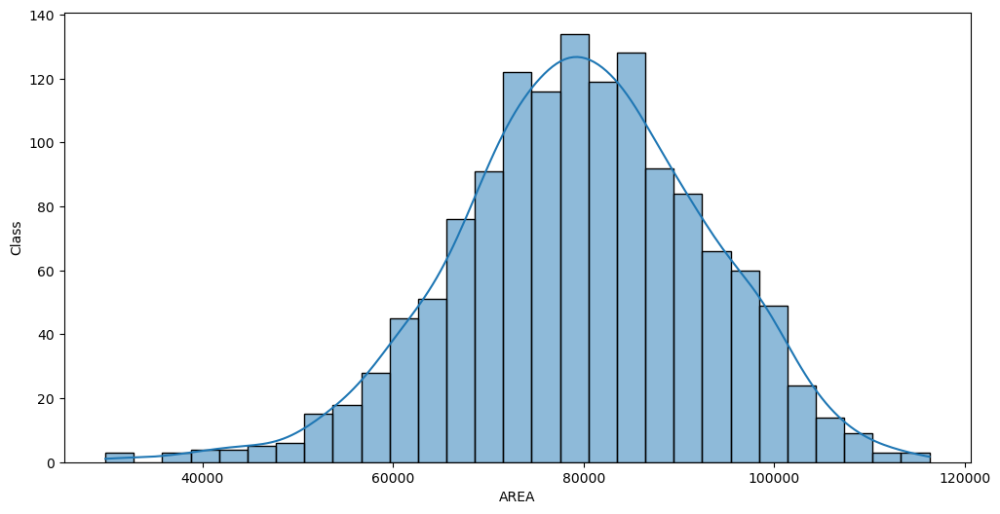

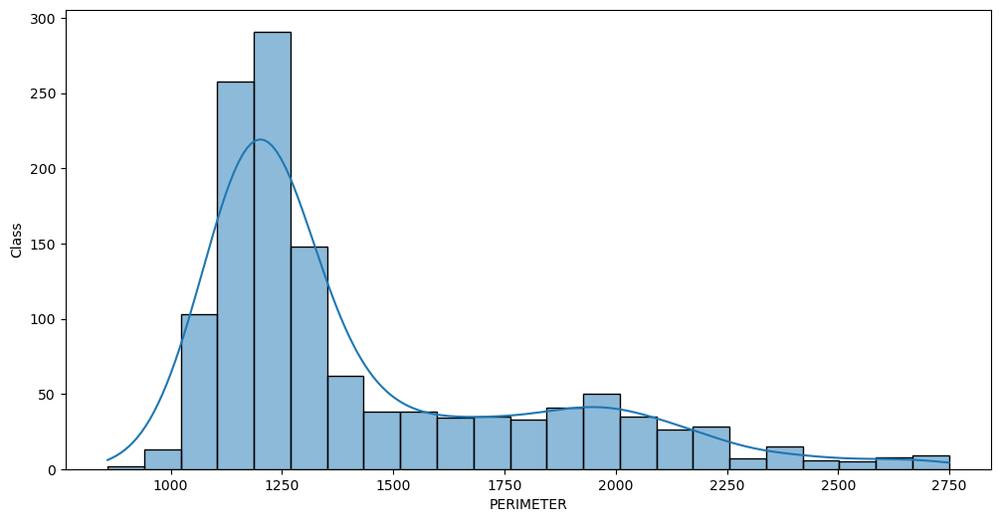

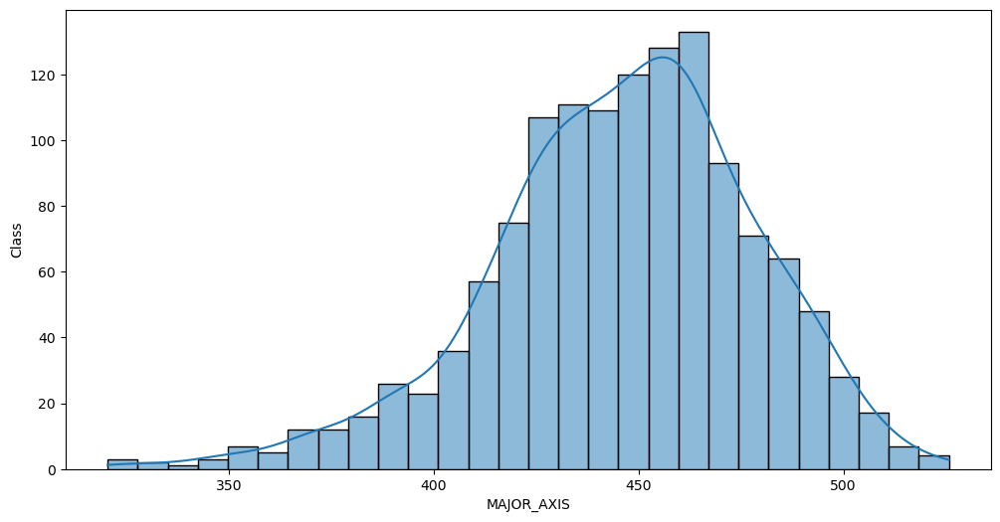

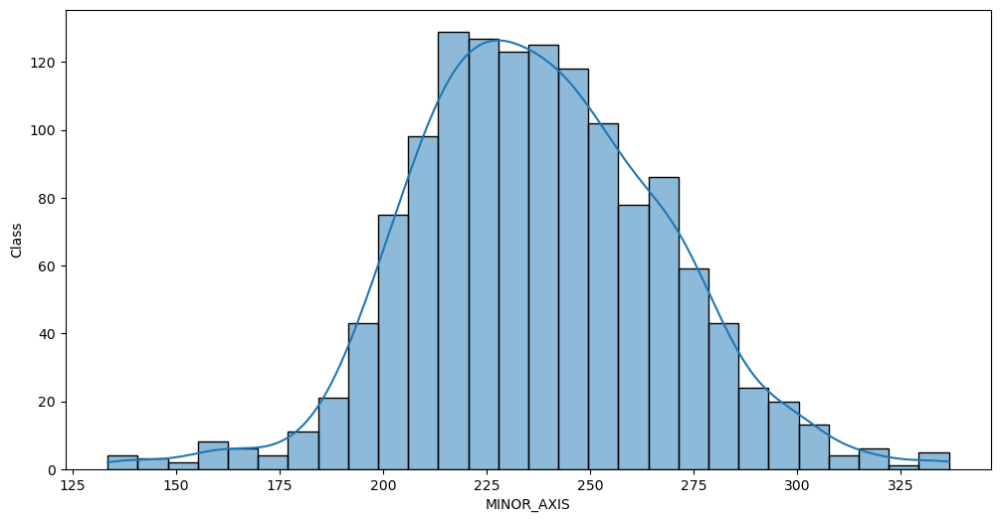

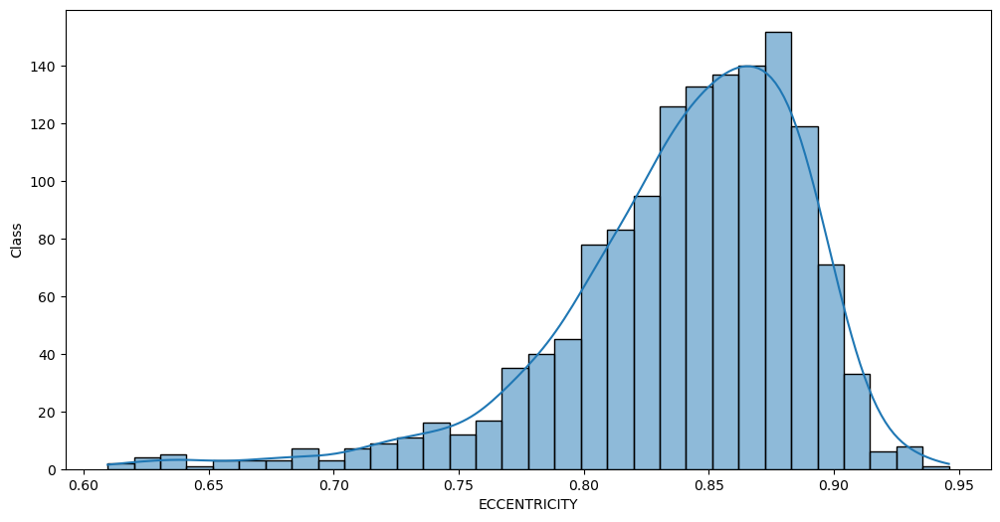

...

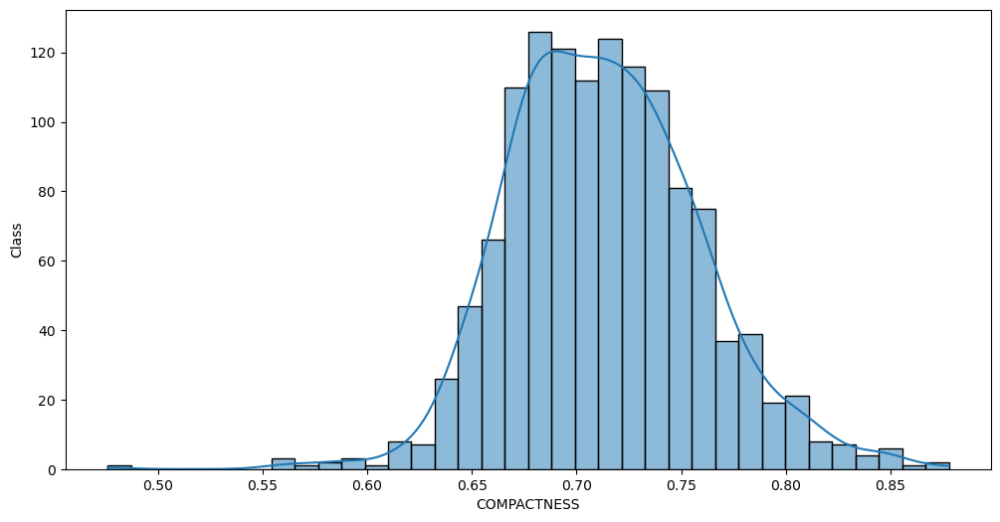

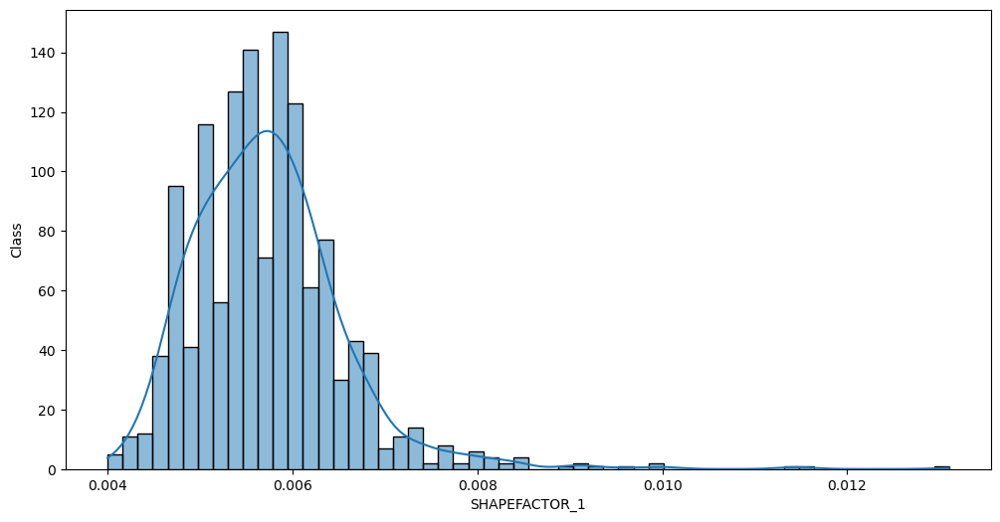

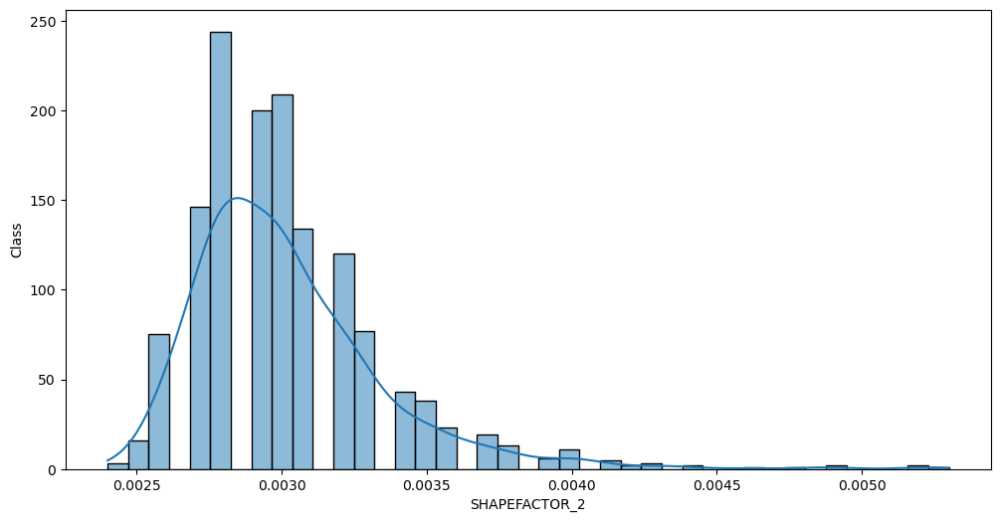

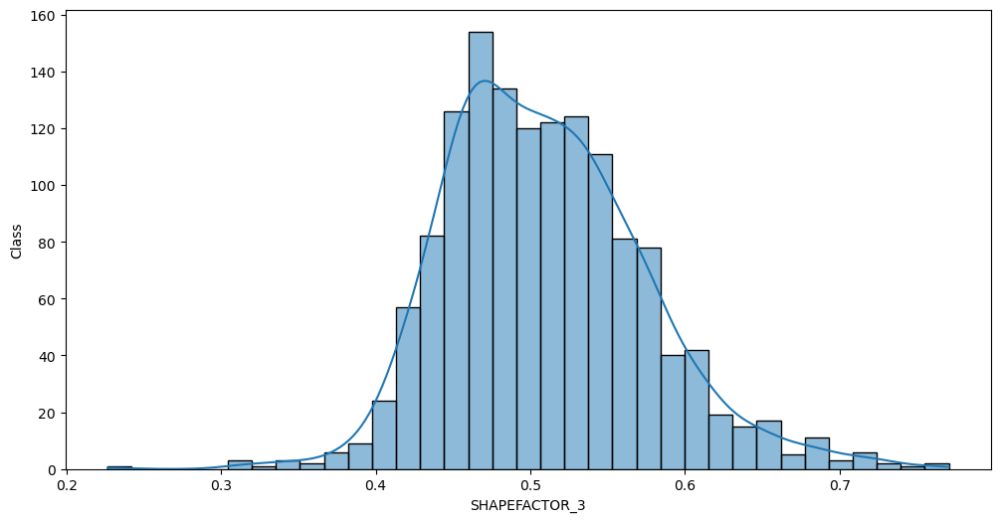

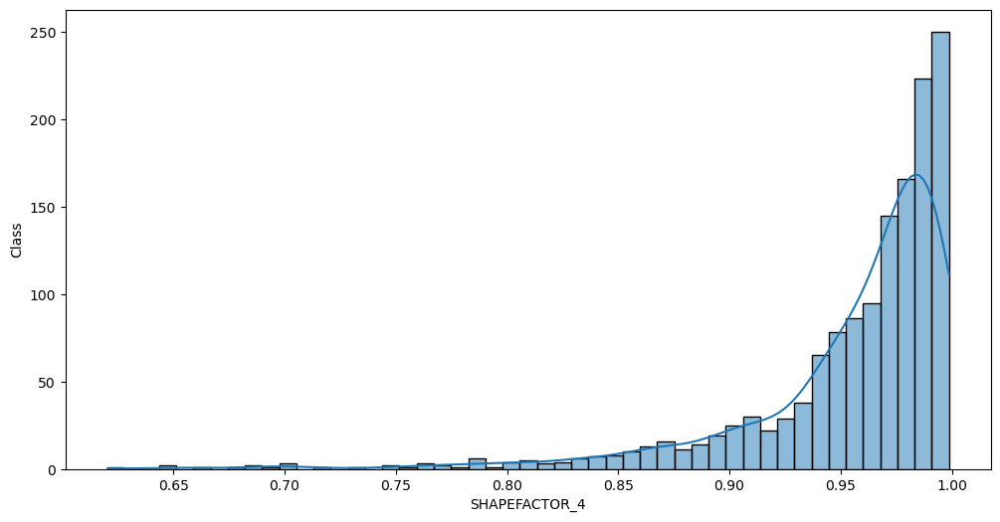

In [9]:
for col in num_col:
    plt.figure(figsize=(12,6))
    sns.histplot(x=col,data=train,kde=True)
    plt.xlabel(col)
    plt.ylabel('Class')
    plt.show()

<Axes: xlabel='Class', ylabel='count'>

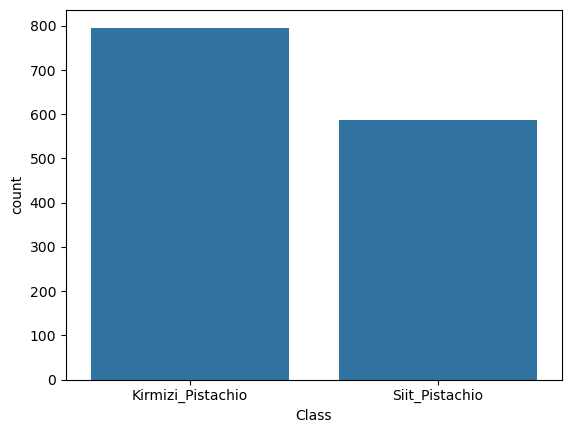

In [10]:
sns.countplot(x='Class',data=train)

In [11]:
# A small imbalance exists in the target variable. Stratified sampling ensures the same class distribution in train and test sets, while the class weight hyperparameter helps the model handle the imbalance during training.

In [12]:
# Because most numeric columns are skewed, I will impute their missing values using the median.
# For categorical features, I will impute missing values using the mode.

In [13]:
for col in num_col:
    median_val = train[col].median()
    train.fillna({col: median_val}, inplace=True)
    print(f"Filled missing in {col} with median: {median_val}")

mode_val = train['Class'].mode()[0]
train.fillna({'Class': mode_val}, inplace=True)
print(f"Filled missing in {col} with mode: {mode_val}")

Filled missing in AREA with median: 79708.0
Filled missing in PERIMETER with median: 1261.583
Filled missing in MAJOR_AXIS with median: 448.4231
Filled missing in MINOR_AXIS with median: 235.92615
Filled missing in ECCENTRICITY with median: 0.849
Filled missing in EQDIASQ with median: 318.7926
Filled missing in SOLIDITY with median: 0.9538
Filled missing in CONVEX_AREA with median: 85091.5
Filled missing in EXTENT with median: 0.72655
Filled missing in ASPECT_RATIO with median: 1.89625
Filled missing in ROUNDNESS with median: 0.6397
Filled missing in COMPACTNESS with median: 0.7108
Filled missing in SHAPEFACTOR_1 with median: 0.0057
Filled missing in SHAPEFACTOR_2 with median: 0.003
Filled missing in SHAPEFACTOR_3 with median: 0.5038
Filled missing in SHAPEFACTOR_4 with median: 0.973
Filled missing in SHAPEFACTOR_4 with mode: Kirmizi_Pistachio


In [14]:
train.isnull().sum()

AREA             0
PERIMETER        0
MAJOR_AXIS       0
MINOR_AXIS       0
ECCENTRICITY     0
EQDIASQ          0
SOLIDITY         0
CONVEX_AREA      0
EXTENT           0
ASPECT_RATIO     0
ROUNDNESS        0
COMPACTNESS      0
SHAPEFACTOR_1    0
SHAPEFACTOR_2    0
SHAPEFACTOR_3    0
SHAPEFACTOR_4    0
Class            0
dtype: int64

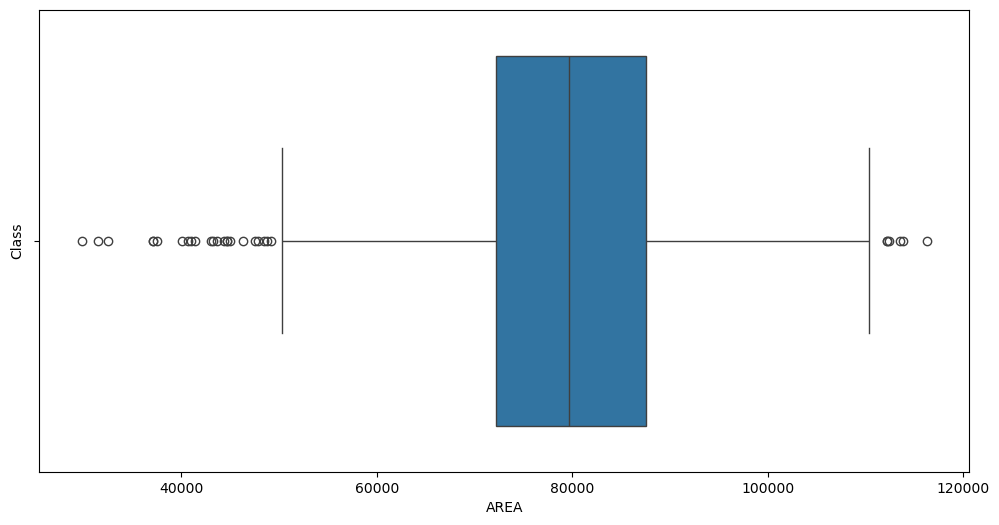

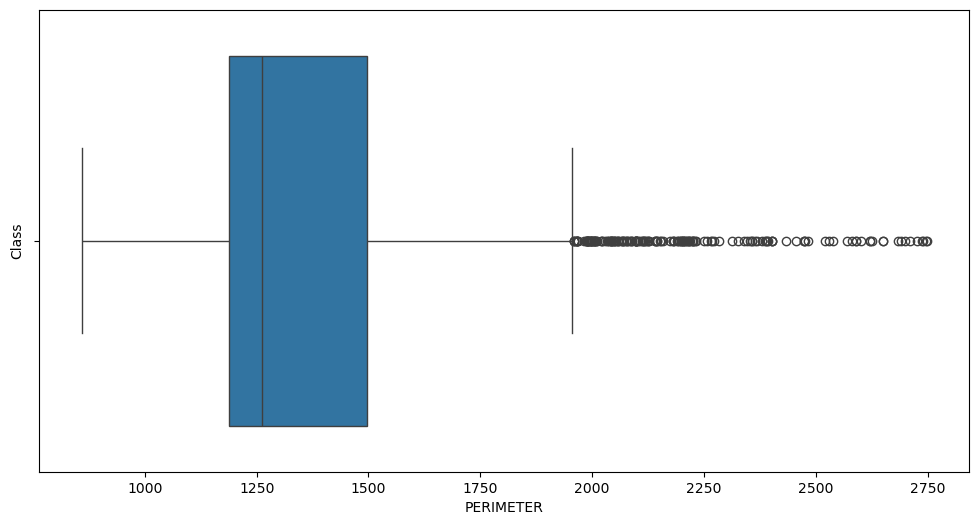

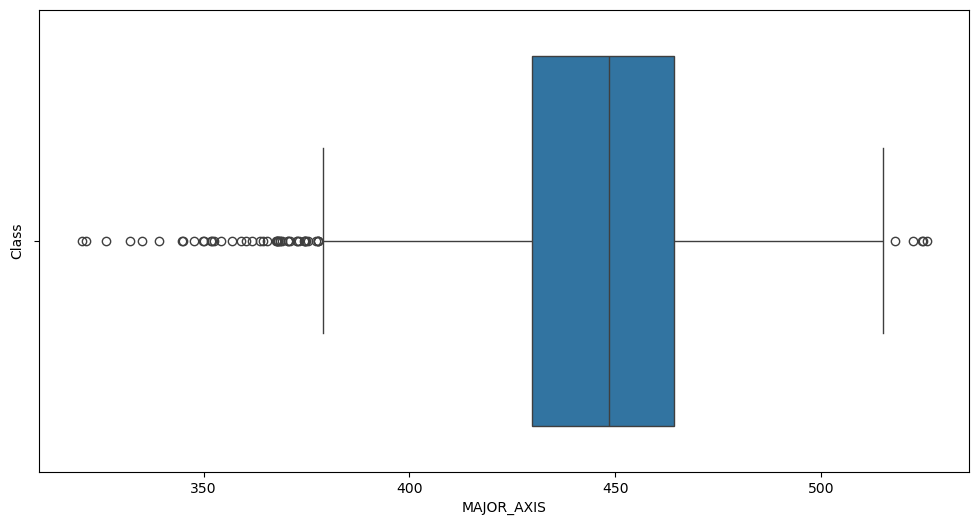

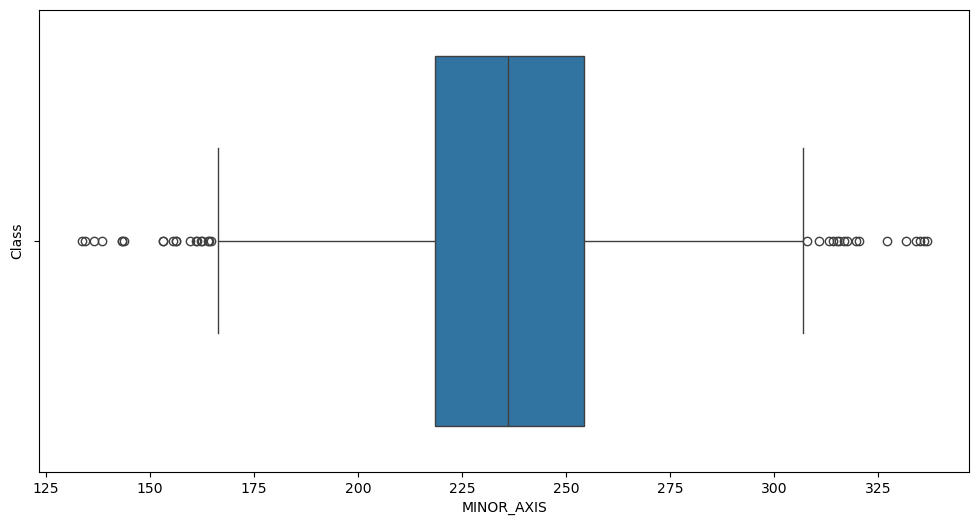

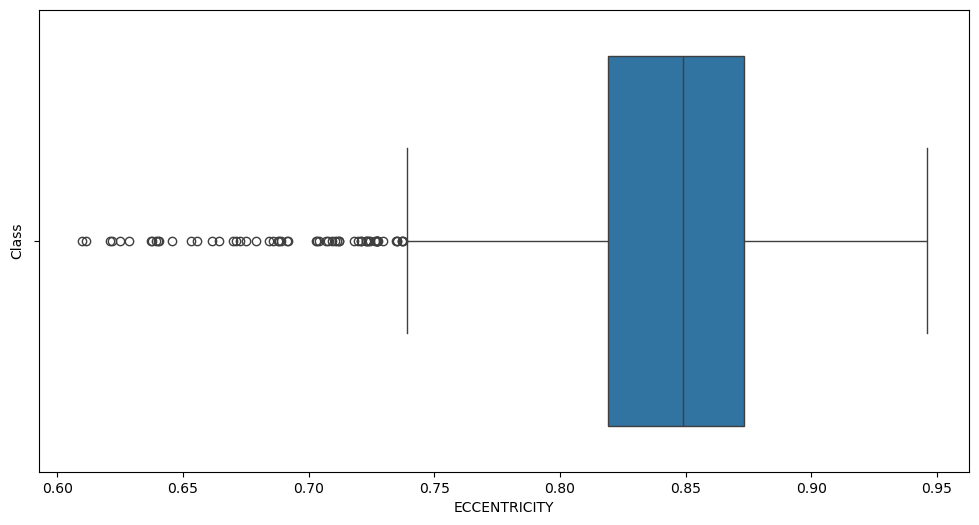

...

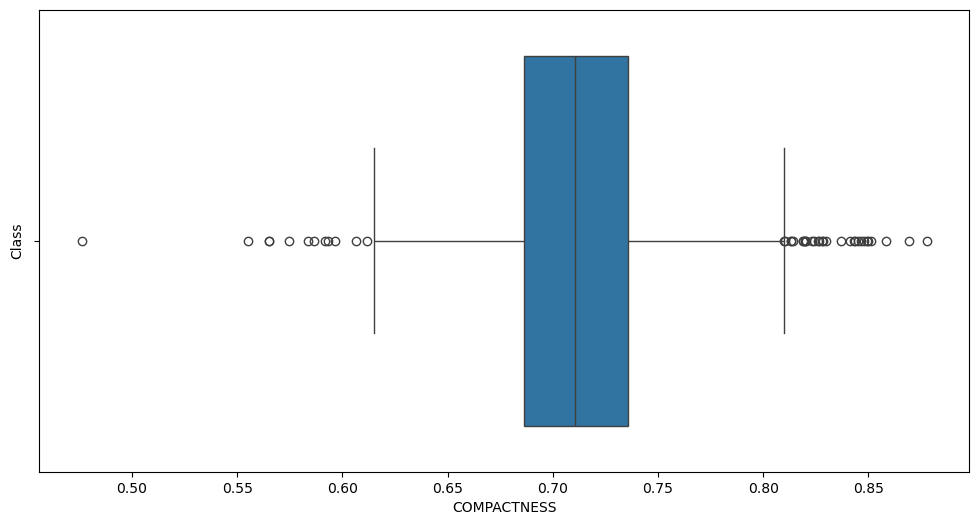

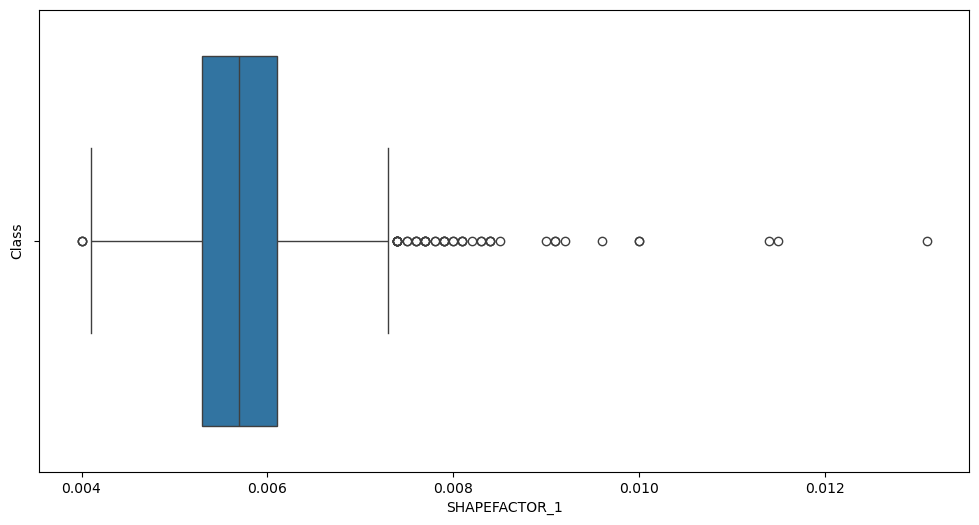

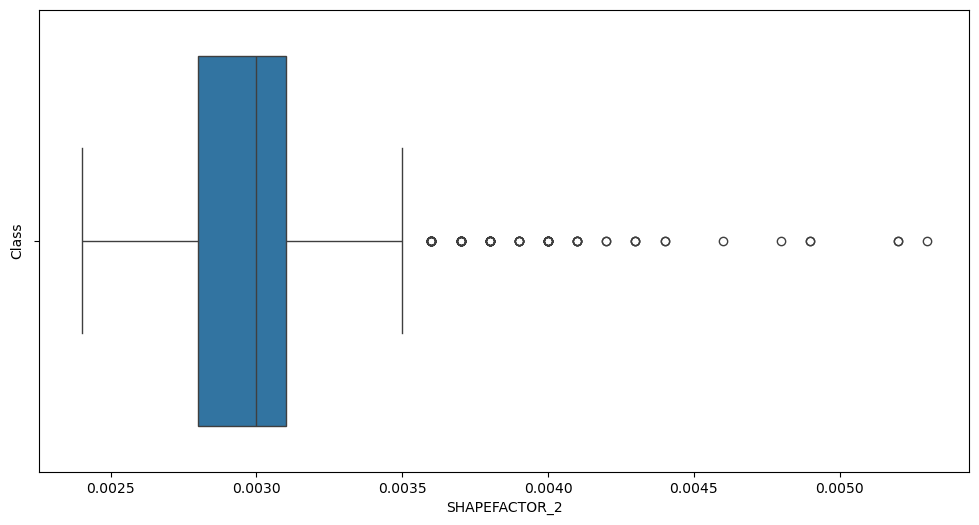

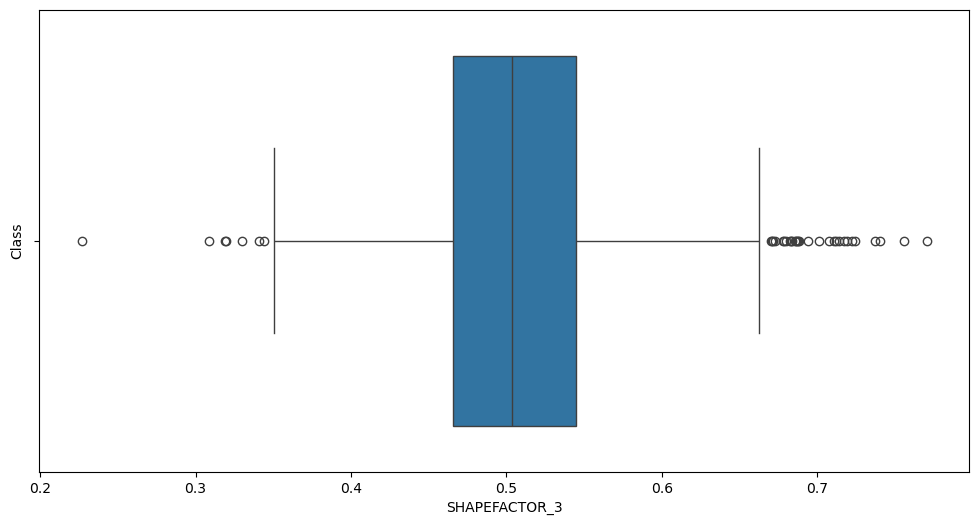

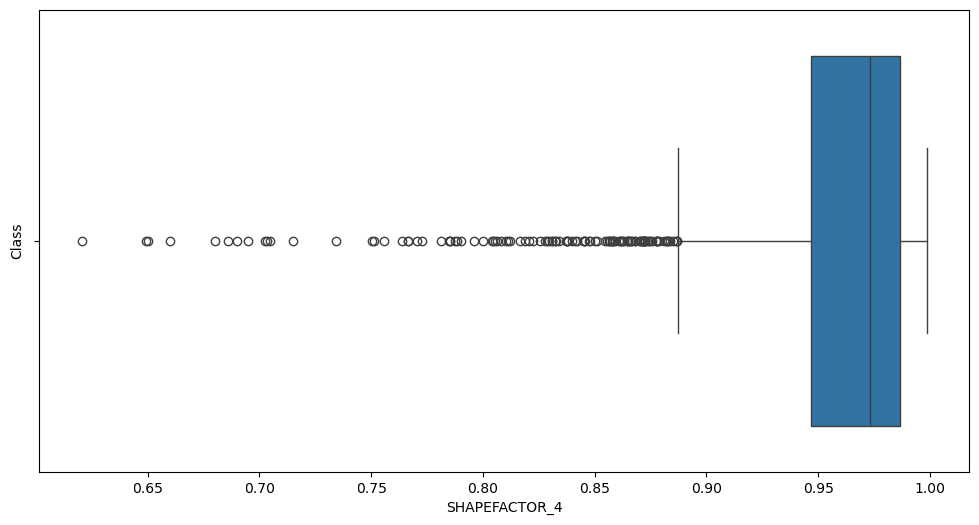

In [15]:
for col in num_col:
    plt.figure(figsize=(12,6))
    sns.boxplot(x=col,data=train)
    plt.xlabel(col)
    plt.ylabel('Class')
    plt.show()

In [16]:
outlier_count = {}

for col in num_col:  
    Q1 = train[col].quantile(0.25)
    Q3 = train[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = train[(train[col] < lower_bound) | (train[col] > upper_bound)]
    outlier_count[col] = outliers.shape[0]

outlier_count

{'AREA': 29,
 'PERIMETER': 171,
 'MAJOR_AXIS': 50,
 'MINOR_AXIS': 36,
 'ECCENTRICITY': 61,
 'EQDIASQ': 28,
 'SOLIDITY': 61,
 'CONVEX_AREA': 39,
 'EXTENT': 56,
 'ASPECT_RATIO': 25,
 'ROUNDNESS': 0,
 'COMPACTNESS': 42,
 'SHAPEFACTOR_1': 49,
 'SHAPEFACTOR_2': 91,
 'SHAPEFACTOR_3': 36,
 'SHAPEFACTOR_4': 121}

In [17]:
train.shape

(1503, 17)

In [18]:
# for col in num_col:
#     Q1 = train[col].quantile(0.25)
#     Q3 = train[col].quantile(0.75)
#     IQR = Q3 - Q1
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR
#     train[col] = train[col].clip(lower=lower_bound, upper=upper_bound)

In [19]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
train[num_col] = scaler.fit_transform(train[num_col])

In [20]:
train.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class
0,0.000000,0.000000,1.012996,-1.155976,1.228916,-0.467493,0.265060,-0.703332,-0.282074,2.014587,-0.102237,-1.646107,1.125,-1.000000,-1.358586,0.272727,Kirmizi_Pistachio
1,1.354999,-0.136337,0.000000,1.116185,-0.765524,1.242318,0.708063,1.132149,0.656415,-0.686974,0.618462,1.083923,0.000,-1.000000,1.015152,0.452020,Siit_Pistachio
2,0.056357,0.000000,1.440336,-0.652005,1.025023,0.047890,-0.007414,-0.040972,-1.651142,1.530633,-0.167432,-1.369060,0.625,-1.333333,-1.138889,-0.108586,Kirmizi_Pistachio
3,-1.395647,-0.560426,-0.716720,-1.360875,0.889713,-1.478816,-0.884152,-1.450093,-1.050088,1.256049,-0.061342,-1.362993,2.000,0.666667,-1.133838,-0.919192,Kirmizi_Pistachio
4,0.284602,0.000000,0.473713,0.046805,0.192771,0.267677,-0.205746,0.286171,0.471880,0.205080,-0.264039,-0.139535,-0.250,-0.666667,-0.104798,0.000000,Kirmizi_Pistachio


In [21]:
## Now doing some Bi_Variate Analysis to see the relationship between features and target variable.

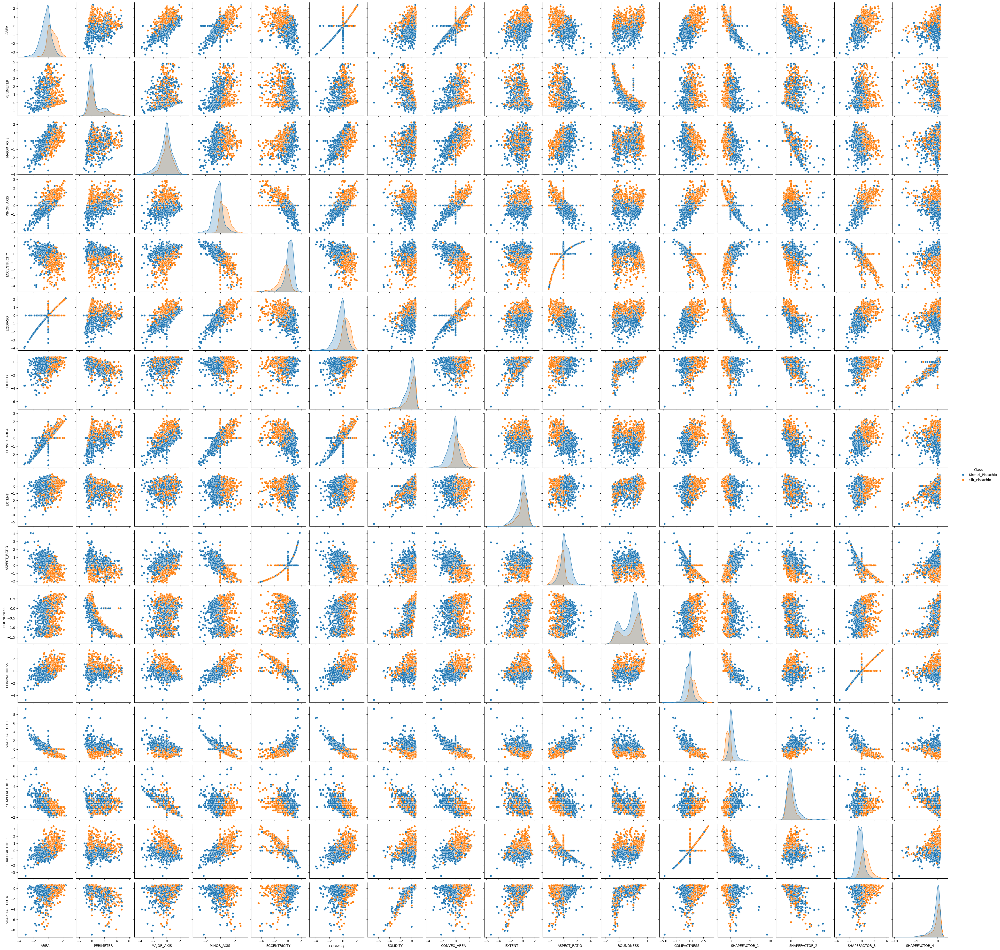

In [22]:
sns.pairplot(train, hue='Class')
plt.show()

In [23]:
le = LabelEncoder()
train['Class'] = le.fit_transform(train['Class'])

In [24]:
## Checking for Correlation to remove highly correlated features.

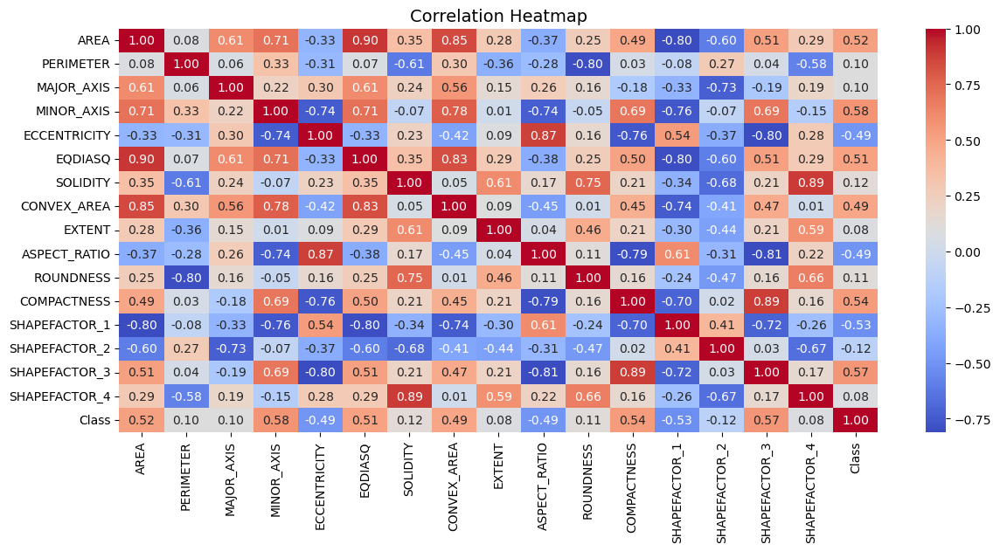

In [25]:
corr=train.corr(numeric_only=True)
plt.figure(figsize=(14,6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap", fontsize=14)
plt.show()

In [26]:
X = train.drop('Class', axis=1)
y = train['Class']

In [27]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [28]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

In [29]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
rf = RandomForestClassifier(random_state=42)

param_dist = {
    "n_estimators": randint(50, 300),
    "max_depth": randint(5, 50),
    "min_samples_split": randint(2, 20),
    "min_samples_leaf": randint(1, 20),
    "max_features": ["sqrt", "log2"],
    "class_weight": ['balanced']
}

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=100,            
    scoring='accuracy',    
    cv=5,                 
    verbose=2,
    random_state=42,
    n_jobs=-1             
)

random_search.fit(X_train, y_train)

print("Best Hyperparameters:", random_search.best_params_)
print("Best F1 Score (weighted):", random_search.best_score_)

best_model = random_search.best_estimator_
y_pred_train = best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_pred_train)
print(f"Training Accuracy: {train_accuracy:.4f}")   
train_f1score = f1_score(y_train, y_pred_train,average='weighted')
print(f"Training F1 Score: {train_f1score:.4f}")
train_conf_matrix = confusion_matrix(y_train, y_pred_train)
print("Training Confusion Matrix:")
print(train_conf_matrix)
y_val_pred = best_model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy:.4f}")
val_f1 = f1_score(y_val, y_val_pred, average='weighted')
print(f"Validation F1 Score: {val_f1:.4f}")
val_conf_matrix = confusion_matrix(y_val, y_val_pred)
print("Validation Confusion Matrix:")
print(val_conf_matrix)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END class_weight=balanced, max_depth=43, max_features=log2, min_samples_leaf=15, min_samples_split=12, n_estimators=121; total time=   0.2s
[CV] END class_weight=balanced, max_depth=43, max_features=log2, min_samples_leaf=15, min_samples_split=12, n_estimators=121; total time=   0.2s
[CV] END class_weight=balanced, max_depth=43, max_features=log2, min_samples_leaf=15, min_samples_split=12, n_estimators=121; total time=   0.2s
[CV] END class_weight=balanced, max_depth=43, max_features=log2, min_samples_leaf=15, min_samples_split=12, n_estimators=121; total time=   0.2s
[CV] END class_weight=balanced, max_depth=43, max_features=log2, min_samples_leaf=15, min_samples_split=12, n_estimators=121; total time=   0.2s
[CV] END class_weight=balanced, max_depth=25, max_features=sqrt, min_samples_leaf=19, min_samples_split=12, n_estimators=252; total time=   0.3s
[CV] END class_weight=balanced, max_depth=25, max_features=sqrt, mi

In [30]:
rf_final = random_search.best_estimator_
rf_final.fit(X_train, y_train)

,n_estimators,102
,criterion,'gini'
,max_depth,20
,min_samples_split,16
,min_samples_leaf,18
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [31]:
test=pd.read_csv('/Users/piyushagarwal/Documents/AI MSE 2/test.csv')

In [32]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             645 non-null    int64  
 1   AREA           645 non-null    int64  
 2   PERIMETER      645 non-null    float64
 3   MAJOR_AXIS     645 non-null    float64
 4   MINOR_AXIS     645 non-null    float64
 5   ECCENTRICITY   645 non-null    float64
 6   EQDIASQ        645 non-null    float64
 7   SOLIDITY       645 non-null    float64
 8   CONVEX_AREA    645 non-null    int64  
 9   EXTENT         645 non-null    float64
 10  ASPECT_RATIO   645 non-null    float64
 11  ROUNDNESS      645 non-null    float64
 12  COMPACTNESS    645 non-null    float64
 13  SHAPEFACTOR_1  645 non-null    float64
 14  SHAPEFACTOR_2  645 non-null    float64
 15  SHAPEFACTOR_3  645 non-null    float64
 16  SHAPEFACTOR_4  645 non-null    float64
dtypes: float64(14), int64(3)
memory usage: 85.8 KB


In [33]:
test_ids = test['id']
test.drop('id', axis=1, inplace=True)

In [34]:
X_test_scaled = scaler.fit_transform(test)

In [35]:
pred=rf_final.predict(X_test_scaled)

/opt/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [36]:
y_test=sol['Class']

In [37]:
le.classes_

array(['Kirmizi_Pistachio', 'Siit_Pistachio'], dtype=object)

In [38]:
y_test_encoded=le.transform(y_test)

In [39]:
test_accuracy = accuracy_score(y_test_encoded, pred)
print(f"Test Accuracy: {test_accuracy:.4f}")
test_f1score = f1_score(y_test_encoded, pred)
print(f"Test F1 Score: {test_f1score:.4f}")
test_conf_matrix = confusion_matrix(y_test_encoded, pred)
print("Test Confusion Matrix:")
print(test_conf_matrix)

Test Accuracy: 0.8698
Test F1 Score: 0.8462
Test Confusion Matrix:
[[330  42]
 [ 42 231]]
